In [1]:
! pip install mesa --quiet
from mesa import Model, Agent
from mesa.time import RandomActivation
from mesa.space import SingleGrid
from mesa.batchrunner import BatchRunner
from IPython.display import HTML
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import Universe25 # custom module

In [2]:
import math
import random
import uuid
import copy

In [3]:
# each step represents 1 week, and the timeframes below are all in weeks 
class Universe25Agent(Agent):
    """
    Universe25 agent
    """

    def __init__(self, uid, pos, model, gender):
        """
        Create a new Universe25 agent.

        Args:
            uid: Unique id for an agent
            pos (x, y): Agent initial location
            gender: Indicator for the agent's gender (female=0, male=1)
        """
        
        super().__init__(uid, model) # allows base class to work with uid + model
        self.uid = uid
        self.pos = pos
        self.gender = gender
        self.life = random.randint(78, 104) # noraml lifespan for mice is 1.5 to 2 years
        self.young = random.randint(8, 12) # mice usually take 2-3 weeks to be mature
        self.social_capacity = random.randint(50, 100) # randomly assign social interaction capacity
        # features for female
        self.preganancy = random.randint(30, 60) # the time needed for getting fertilization
        self.gestation_period = None # gestation period

    def step(self):
        # simulate the social interaction
        for neighbor in self.model.grid.neighbor_iter(self.pos):
            x1, y1 = self.pos
            x2, y2 = neighbor.pos
            # when mice are within a distance of 2 grids from their neighbors
            # they need to be social => social_capacity -= 1
            if math.sqrt((x1-x2)**2 + (y1-y2)**2) <= 2:
                self.social_capacity -= 1
                # if female, decrease the time needed for getting conception, when:
                # it is not a child agent, its social_capacity>0, neighbors are males, and those males' social_capacity>0 as well
                if (~self.young and self.social_capacity>0 and self.gender==0 and neighbor.gender==1 and neighbor.social_capacity>0):
                    self.preganancy -= 1
        
        # if agent is still a cub, have 10% death rate
        if self.young:
            if random.random() < 0.1:
                self.life = 1
            else:
                self.young -= 1
        
        # getting old at each step, and remove it if life ends
        self.life -= 1
        if self.life <= 0:
            self.model.grid._remove_agent(self.pos, self)
            self.model.schedule.remove(self)
            self = None # need this or the cell_content will still content the death agents

        # if agent has fertilized, then it's preganant
        elif self.preganancy <= 0:
            self.gestation_period = random.randint(3, 4) # gestation period is between 3-4 weeks
            self.preganancy = random.randint(30, 60) # reset the fertilization chance
        
        # if alive, reduce gestation_period at each time step
        if self:
            # when social_capacity <= 0, cannot give birth anymore
            if self.social_capacity > 0 and self.gestation_period:
                self.gestation_period -= 1
                
        # agents will move to other empty grids at each step
            self.model.grid.move_to_empty(self)


class Universe25Model(Model):
    """
    Model class for the Universe25 model.
    """

    def __init__(self, height=20, width=20, density=0.3, gender_ratio=0.5): # need to give more space so agents have empty spot to move
        """
        Create a new Universe25 model.

        Args:
            height: Grid height
            width: Grid width
            density: Initial population rate
            gender_ratio: female: male
        """

        self.height = height
        self.width = width
        self.density = density
        self.gender_ratio = gender_ratio

        self.schedule = RandomActivation(self)
        self.grid = SingleGrid(width, height, torus=True)

        self.runtime = 0 # record overall running steps

        # Set up agents
        # use a grid iterator that returns the coordinates of a cell as well as its contents. (coord_iter)
        for cell in self.grid.coord_iter():
            x = cell[1]
            y = cell[2]
            uid = uuid.uuid4() # generate unique id 
            if self.random.random() < self.density:
                if self.random.random() < self.gender_ratio:
                    gender = 1
                else:
                    gender = 0

                agent = Universe25Agent(uid, (x, y), self, gender)
                self.grid.position_agent(agent, (x, y))
                self.schedule.add(agent)

        # keep simulation running
        self.running = True 

    def step(self):
        """
        Run one step of the model. If the population drops below the threshold or exceeds the grid, halt the model.
        """
        
        self.schedule.step()
        # spawn new agents
        agent_list = copy.deepcopy(self.schedule._agents).values() # this solves: 'OrderedDict mutated during iteration'
        for agent in agent_list:
            # when it's the expected due date, spawn an offspring
            if agent.gestation_period == 0:
                # 1 litter can have 3-14 pups
                for _ in range(random.randint(3,15)):
                    # get empty cell to put the new agent
                    empty = self.grid.find_empty()
                    if empty:
                        x = empty[0]
                        y = empty[1]
                        uid = uuid.uuid4()
                        gender = random.randint(0, 1)
                        offspring = Universe25Agent(uid, (x, y), self, gender)
                        self.grid.position_agent(offspring, (x, y))
                        self.schedule.add(offspring)

        self.runtime += 1
        
        if self.schedule.get_agent_count() <= 0 or self.schedule.get_agent_count() >= self.height*self.width:
            self.running = False

### Simulation

In [7]:
# population reaches minimum
model = Universe25Model()
while model.running:
    model.step()
    print(f'Round: {model.runtime}\tNumber of Agents:{model.schedule.get_agent_count()}')

Round: 1	Number of Agents:117
Round: 2	Number of Agents:104
Round: 3	Number of Agents:94
Round: 4	Number of Agents:84
Round: 5	Number of Agents:69
Round: 6	Number of Agents:59
Round: 7	Number of Agents:54
Round: 8	Number of Agents:48
Round: 9	Number of Agents:44
Round: 10	Number of Agents:41
Round: 11	Number of Agents:39
Round: 12	Number of Agents:37
Round: 13	Number of Agents:37
Round: 14	Number of Agents:37
Round: 15	Number of Agents:37
Round: 16	Number of Agents:37
Round: 17	Number of Agents:37
Round: 18	Number of Agents:37
Round: 19	Number of Agents:37
Round: 20	Number of Agents:37
Round: 21	Number of Agents:37
Round: 22	Number of Agents:37
Round: 23	Number of Agents:37
Round: 24	Number of Agents:37
Round: 25	Number of Agents:37
Round: 26	Number of Agents:37
Round: 27	Number of Agents:37
Round: 28	Number of Agents:37
Round: 29	Number of Agents:37
Round: 30	Number of Agents:37
Round: 31	Number of Agents:37
Round: 32	Number of Agents:37
Round: 33	Number of Agents:37
Round: 34	Number 

In [5]:
# population reaches maximum
model = Universe25Model()
while model.running:
    model.step()
    print(f'Round: {model.runtime}\tNumber of Agents:{model.schedule.get_agent_count()}')

Round: 1	Number of Agents:123
Round: 2	Number of Agents:108
Round: 3	Number of Agents:99
Round: 4	Number of Agents:91
Round: 5	Number of Agents:80
Round: 6	Number of Agents:73
Round: 7	Number of Agents:68
Round: 8	Number of Agents:62
Round: 9	Number of Agents:60
Round: 10	Number of Agents:58
Round: 11	Number of Agents:52
Round: 12	Number of Agents:50
Round: 13	Number of Agents:50
Round: 14	Number of Agents:50
Round: 15	Number of Agents:50
Round: 16	Number of Agents:50
Round: 17	Number of Agents:50
Round: 18	Number of Agents:50
Round: 19	Number of Agents:50
Round: 20	Number of Agents:50
Round: 21	Number of Agents:50
Round: 22	Number of Agents:50
Round: 23	Number of Agents:50
Round: 24	Number of Agents:50
Round: 25	Number of Agents:50
Round: 26	Number of Agents:50
Round: 27	Number of Agents:50
Round: 28	Number of Agents:50
Round: 29	Number of Agents:50
Round: 30	Number of Agents:50
Round: 31	Number of Agents:50
Round: 32	Number of Agents:50
Round: 33	Number of Agents:50
Round: 34	Number 

### Visualization

In [8]:
# population reaches minimum
model = Universe25Model()
ani = Universe25.animate(model)
HTML(ani.to_jshtml())

In [9]:
# population reaches maximum
model = Universe25Model()
ani = Universe25.animate(model)
HTML(ani.to_jshtml())

### Generalization

In [4]:
def Unverse25_Dataframe(density, iteration=100):
    '''
    Create dataframe for agent number at each step among all the iteration
    
    Args:
        density: Initial population rate
        iteration: Total number of iteration for the simulation
    '''
    lst = []
    max_len = 0
    for i in range(iteration):
        sub_lst = []
        model = Universe25Model(density=density)
        while model.running:
            model.step()
            sub_lst.append(model.schedule.get_agent_count())
        if max_len < len(sub_lst):
            max_len = len(sub_lst)
        lst.append(sub_lst)

    col = ['step'+str(i) for i in range(1, max_len+1)]
    df = pd.DataFrame(lst, columns=col)
    
    return df

In [5]:
df1 = Unverse25_Dataframe(density=0.1)
df2 = Unverse25_Dataframe(density=0.2)
df3 = Unverse25_Dataframe(density=0.3)
df4 = Unverse25_Dataframe(density=0.4)
df5 = Unverse25_Dataframe(density=0.5)
df6 = Unverse25_Dataframe(density=0.6)
df7 = Unverse25_Dataframe(density=0.7)
df8 = Unverse25_Dataframe(density=0.8)
df9 = Unverse25_Dataframe(density=0.9)

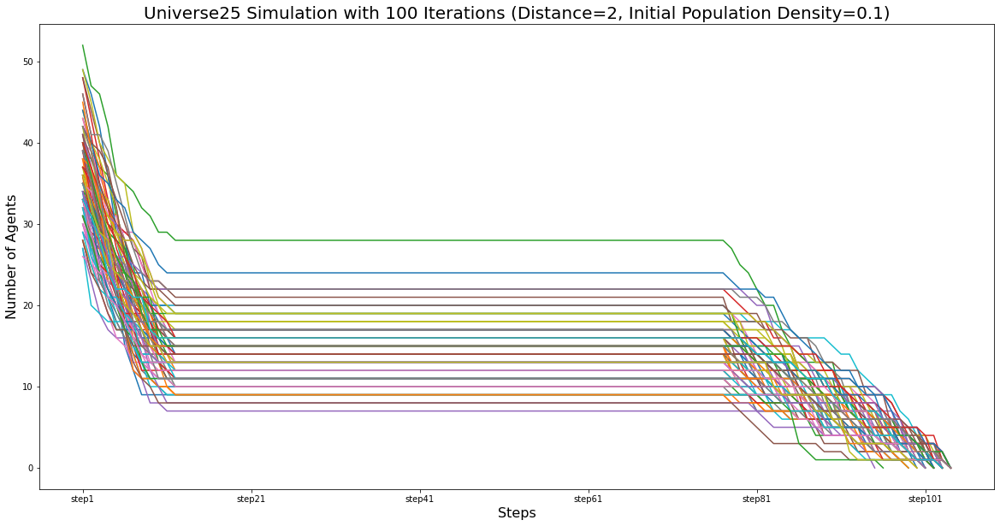

In [6]:
ax = df1.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=2, Initial Population Density=0.1)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

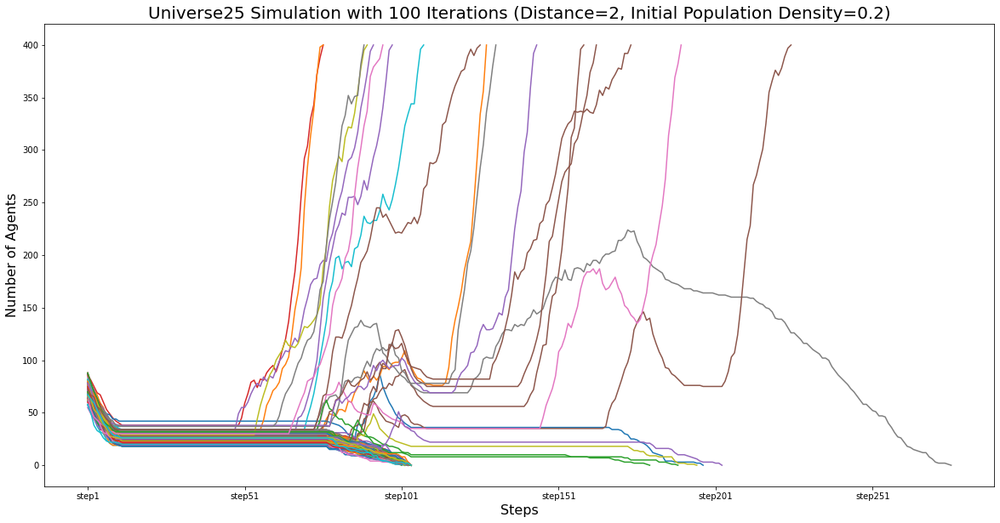

In [7]:
ax = df2.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=2, Initial Population Density=0.2)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

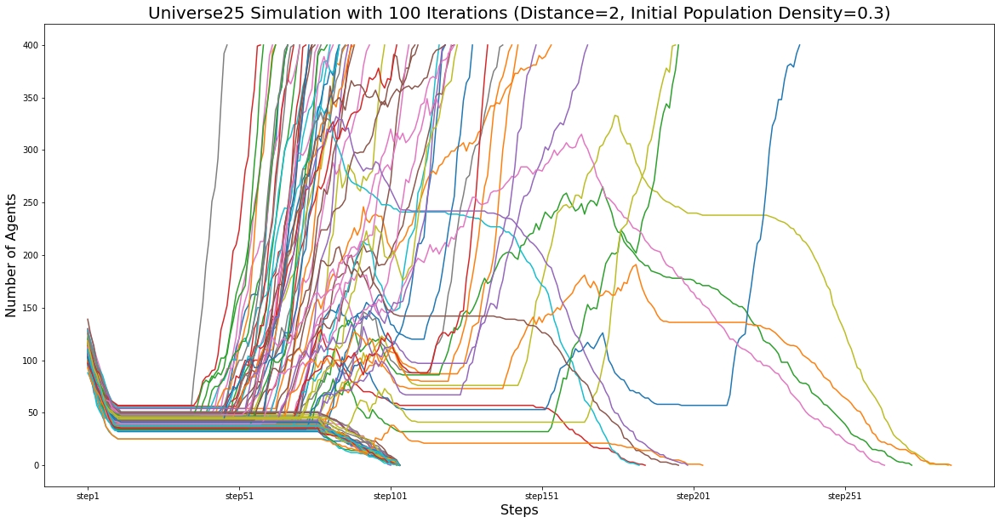

In [8]:
ax = df3.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=2, Initial Population Density=0.3)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

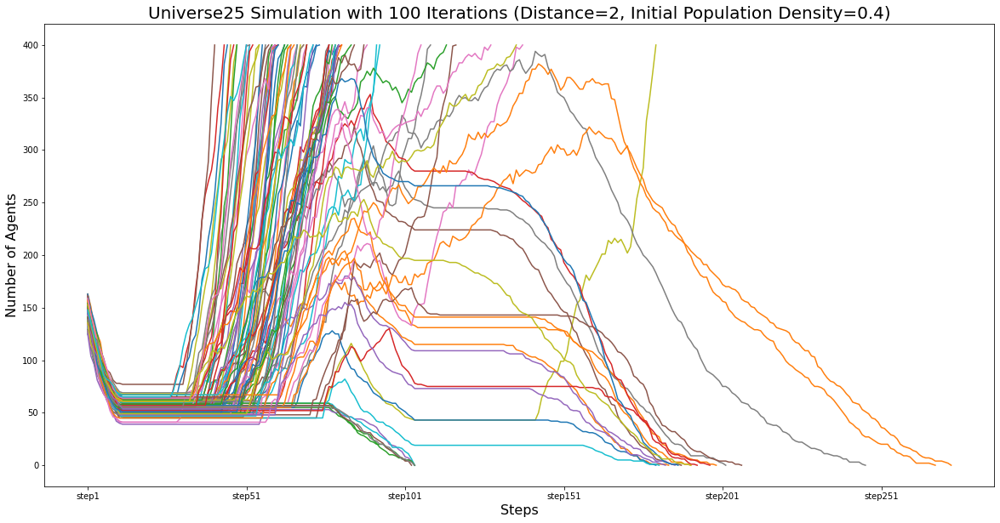

In [9]:
ax = df4.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=2, Initial Population Density=0.4)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

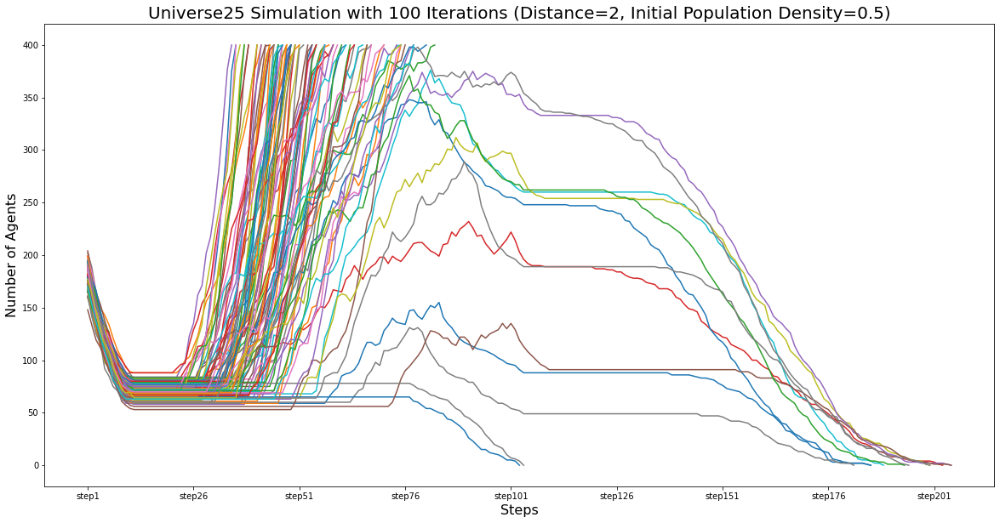

In [10]:
ax = df5.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=2, Initial Population Density=0.5)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

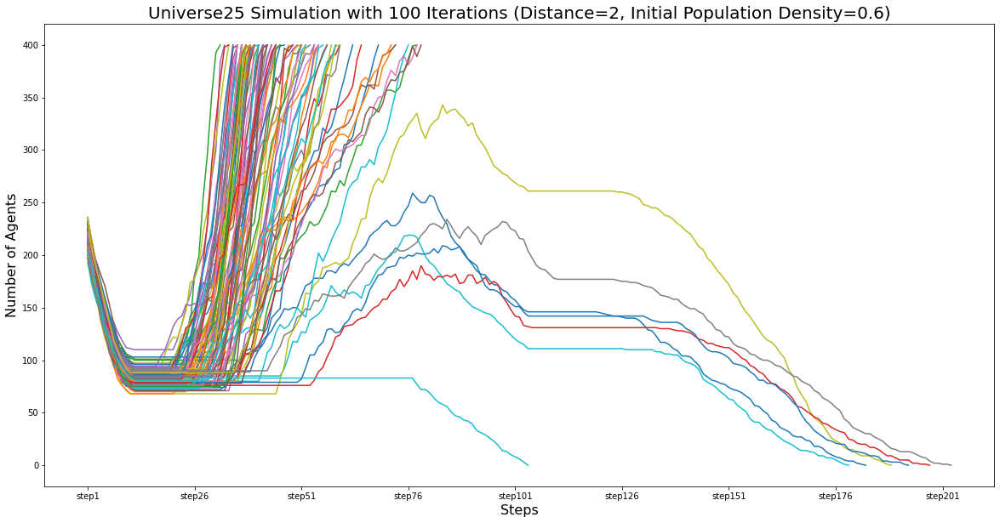

In [11]:
ax = df6.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=2, Initial Population Density=0.6)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

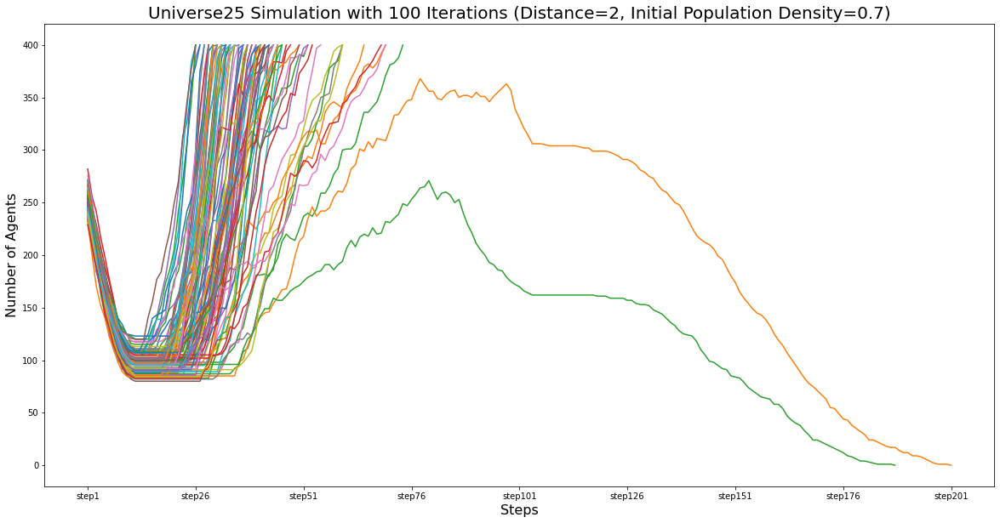

In [12]:
ax = df7.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=2, Initial Population Density=0.7)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

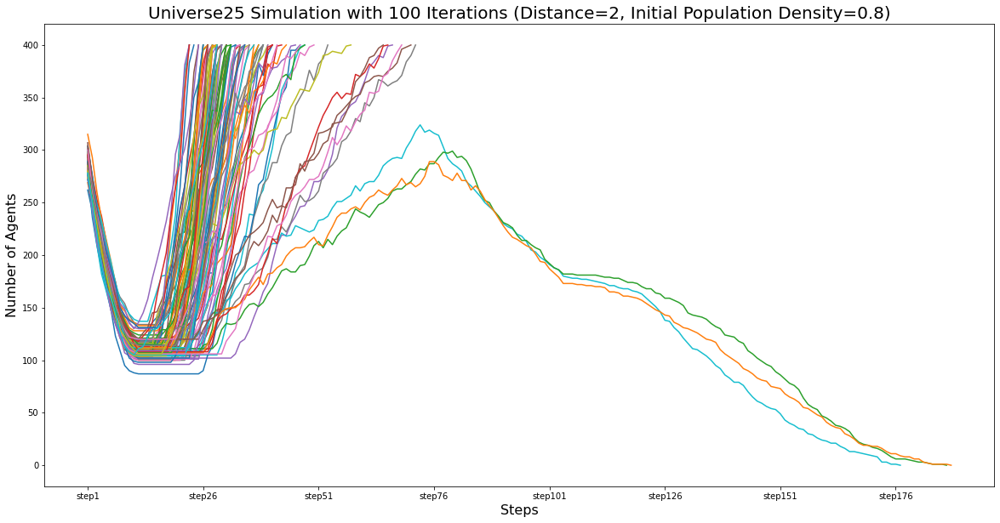

In [13]:
ax = df8.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=2, Initial Population Density=0.8)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

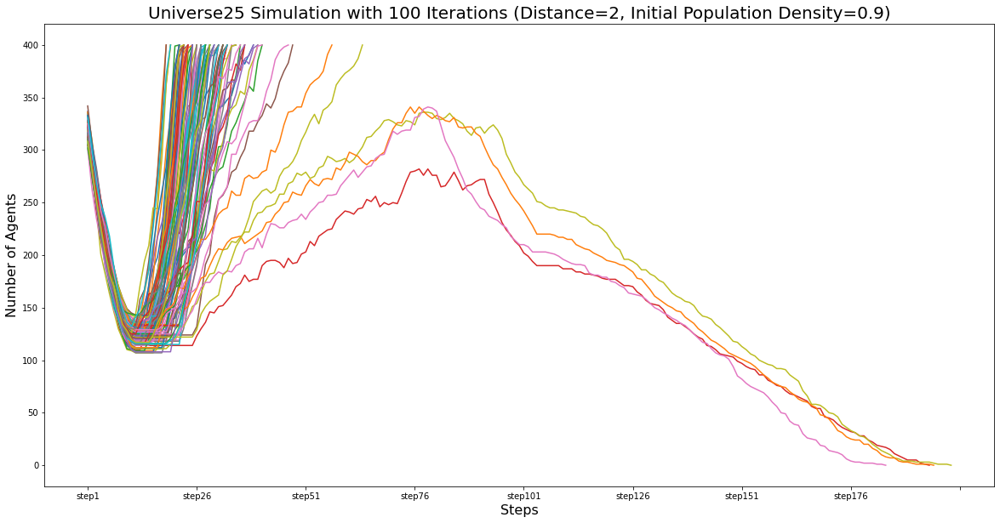

In [14]:
ax = df9.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=2, Initial Population Density=0.9)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

I also increased the social interactionable distance (from 2 to 3 and 4) in the following, so agents will have more interactions with neighbors in one step. Therefore, we can see if more interactions will bring difference.

In [15]:
# each step represents 1 week, and the timeframes below are all in weeks 
class Universe25Agent(Agent):
    """
    Universe25 agent
    """

    def __init__(self, uid, pos, model, gender):
        """
        Create a new Universe25 agent.

        Args:
            uid: Unique id for an agent
            pos (x, y): Agent initial location
            gender: Indicator for the agent's gender (female=0, male=1)
        """
        
        super().__init__(uid, model) # allows base class to work with uid + model
        self.uid = uid
        self.pos = pos
        self.gender = gender
        self.life = random.randint(78, 104) # noraml lifespan for mice is 1.5 to 2 years
        self.young = random.randint(8, 12) # mice usually take 2-3 weeks to be mature
        self.social_capacity = random.randint(50, 100) # randomly assign social interaction capacity
        # features for female
        self.preganancy = random.randint(30, 60) # the time needed for getting fertilization
        self.gestation_period = None # gestation period

    def step(self):
        # simulate the social interaction
        for neighbor in self.model.grid.neighbor_iter(self.pos):
            x1, y1 = self.pos
            x2, y2 = neighbor.pos
            # when mice are within a distance of 2 grids from their neighbors
            # they need to be social => social_capacity -= 1
            if math.sqrt((x1-x2)**2 + (y1-y2)**2) <= 3:
                self.social_capacity -= 1
                # if female, decrease the time needed for getting conception, when:
                # it is not a child agent, its social_capacity>0, neighbors are males, and those males' social_capacity>0 as well
                if (~self.young and self.social_capacity>0 and self.gender==0 and neighbor.gender==1 and neighbor.social_capacity>0):
                    self.preganancy -= 1
        
        # if agent is still a cub, have 10% death rate
        if self.young:
            if random.random() < 0.1:
                self.life = 1
            else:
                self.young -= 1
        
        # getting old at each step, and remove it if life ends
        self.life -= 1
        if self.life <= 0:
            self.model.grid._remove_agent(self.pos, self)
            self.model.schedule.remove(self)
            self = None # need this or the cell_content will still content the death agents

        # if agent has fertilized, then it's preganant
        elif self.preganancy <= 0:
            self.gestation_period = random.randint(3, 4) # gestation period is between 3-4 weeks
            self.preganancy = random.randint(30, 60) # reset the fertilization chance
        
        # if alive, reduce gestation_period at each time step
        if self:
            # when social_capacity <= 0, cannot give birth anymore
            if self.social_capacity > 0 and self.gestation_period:
                self.gestation_period -= 1
                
        # agents will move to other empty grids at each step
            self.model.grid.move_to_empty(self)
        

def Unverse25_Dataframe(density, iteration=100):
    '''
    Create dataframe for agent number at each step among all the iteration
    
    Args:
        density: Initial population rate
        iteration: Total number of iteration for the simulation
    '''
    lst = []
    max_len = 0
    for i in range(iteration):
        sub_lst = []
        model = Universe25Model(density=density)
        while model.running:
            model.step()
            sub_lst.append(model.schedule.get_agent_count())
        if max_len < len(sub_lst):
            max_len = len(sub_lst)
        lst.append(sub_lst)

    col = ['step'+str(i) for i in range(1, max_len+1)]
    df = pd.DataFrame(lst, columns=col)
    
    return df

In [16]:
df11 = Unverse25_Dataframe(density=0.1)
df12 = Unverse25_Dataframe(density=0.2)
df13 = Unverse25_Dataframe(density=0.3)
df14 = Unverse25_Dataframe(density=0.4)
df15 = Unverse25_Dataframe(density=0.5)
df16 = Unverse25_Dataframe(density=0.6)
df17 = Unverse25_Dataframe(density=0.7)
df18 = Unverse25_Dataframe(density=0.8)
df19 = Unverse25_Dataframe(density=0.9)

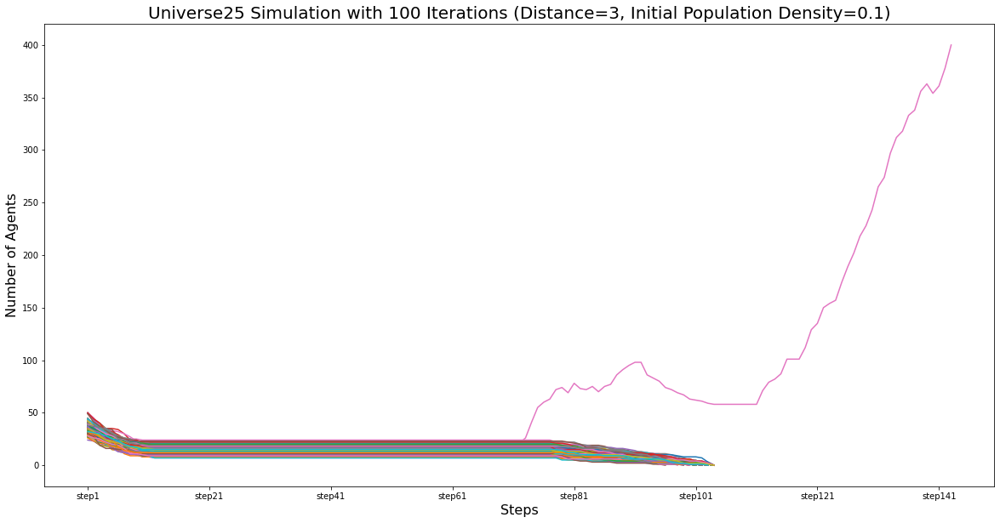

In [17]:
ax = df11.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=3, Initial Population Density=0.1)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

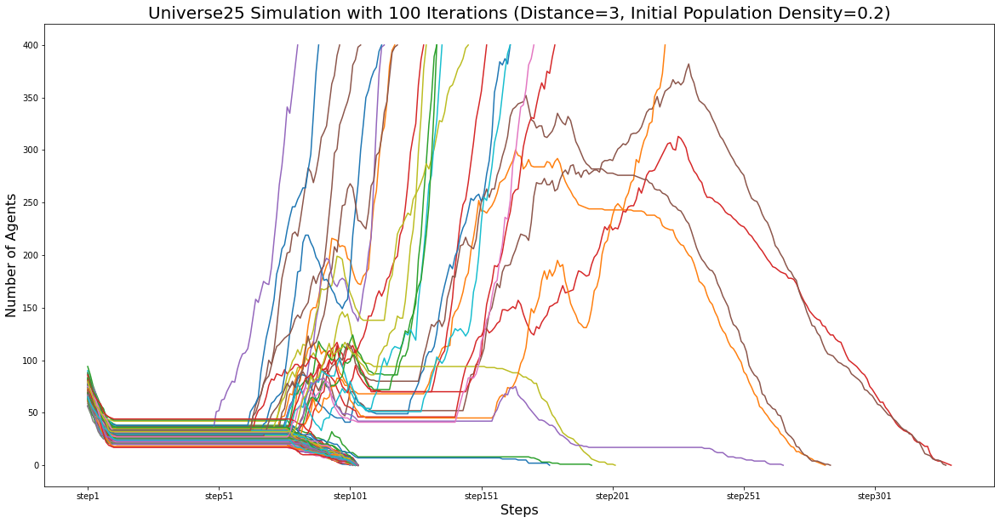

In [18]:
ax = df12.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=3, Initial Population Density=0.2)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

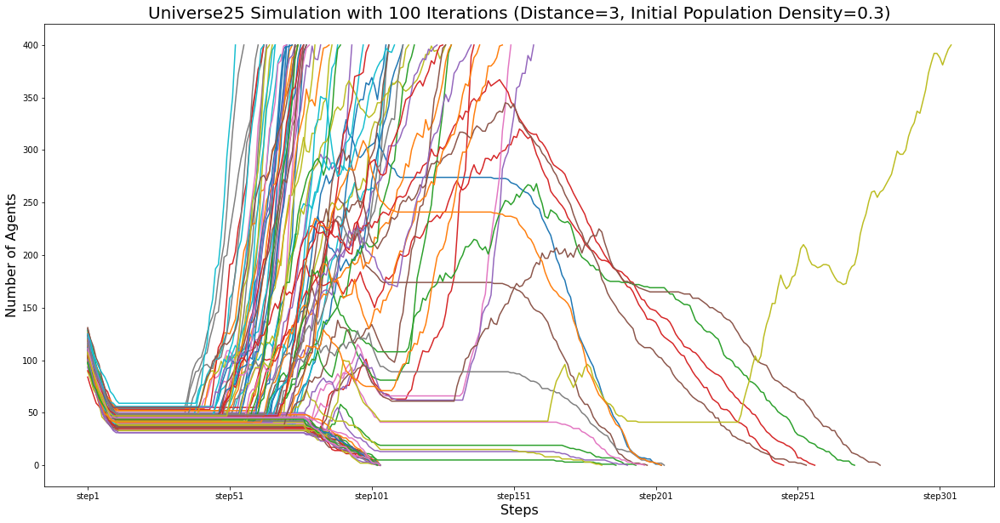

In [19]:
ax = df13.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=3, Initial Population Density=0.3)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

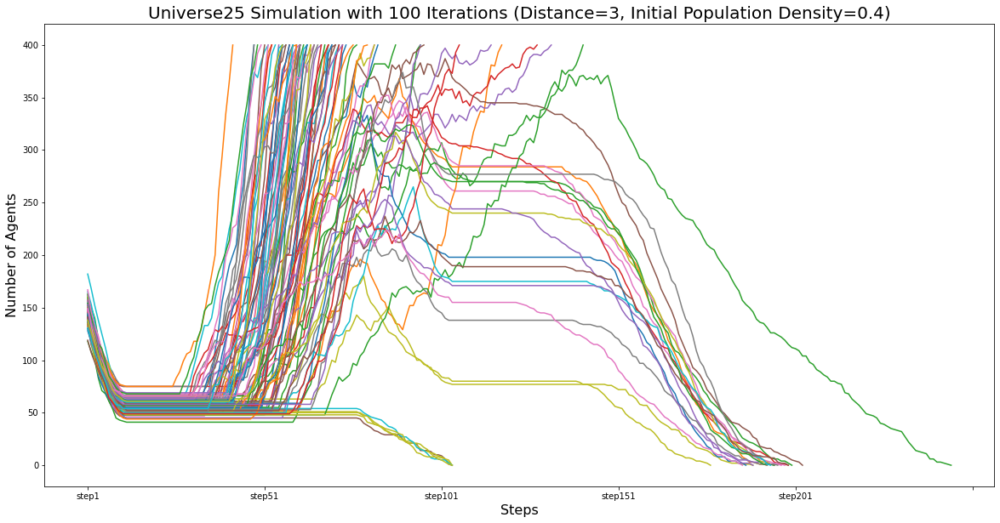

In [20]:
ax = df14.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=3, Initial Population Density=0.4)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

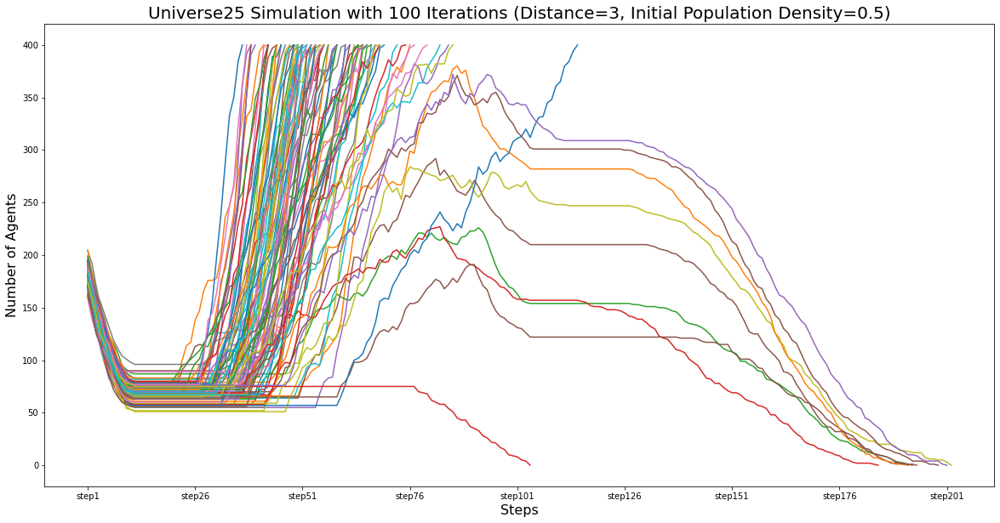

In [21]:
ax = df15.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=3, Initial Population Density=0.5)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

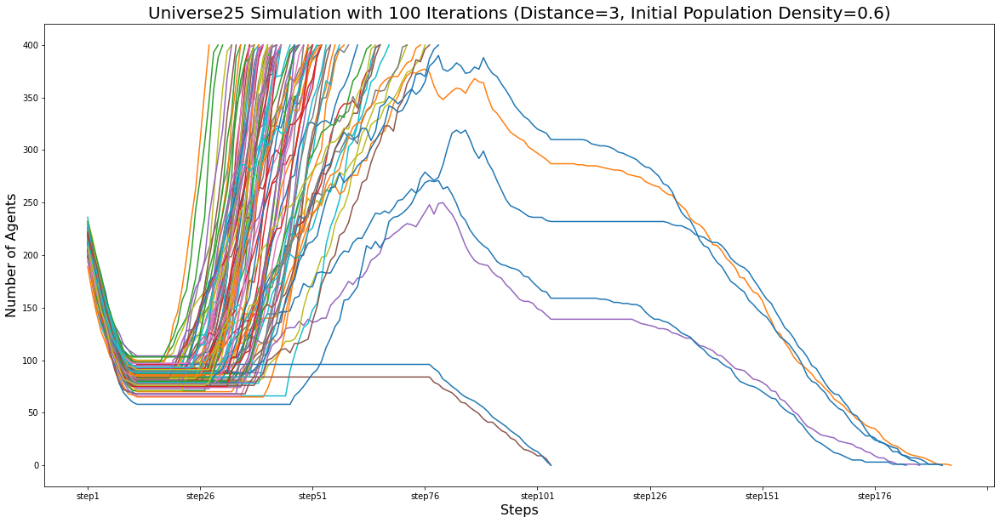

In [22]:
ax = df16.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=3, Initial Population Density=0.6)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

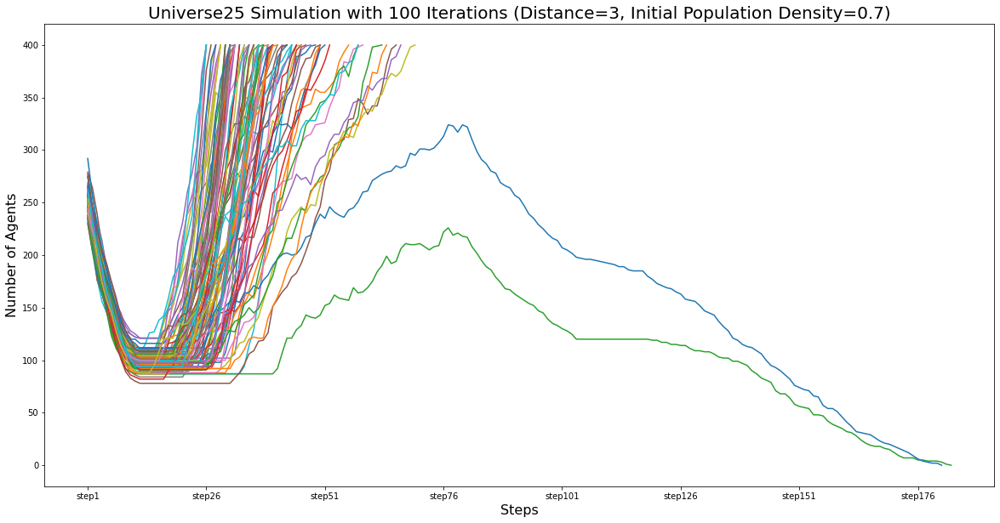

In [23]:
ax = df17.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=3, Initial Population Density=0.7)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

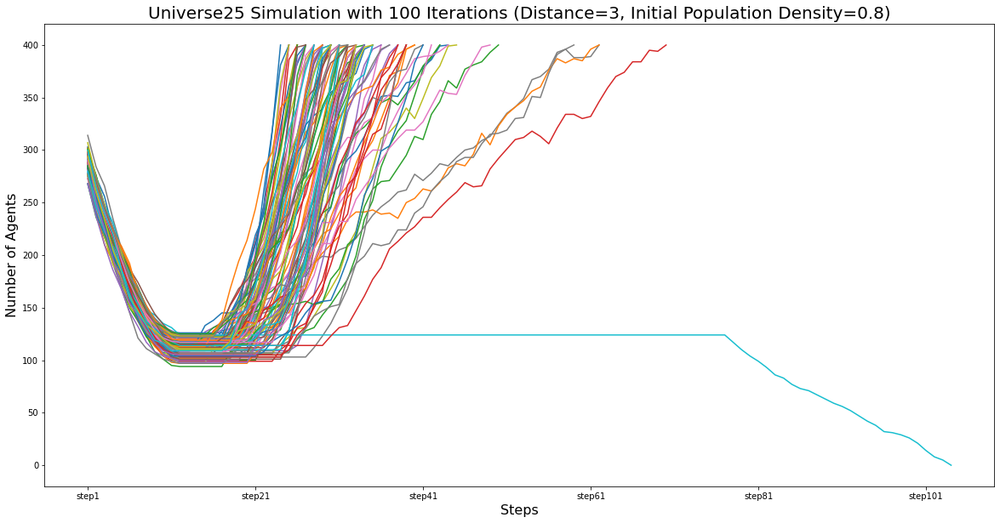

In [24]:
ax = df18.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=3, Initial Population Density=0.8)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

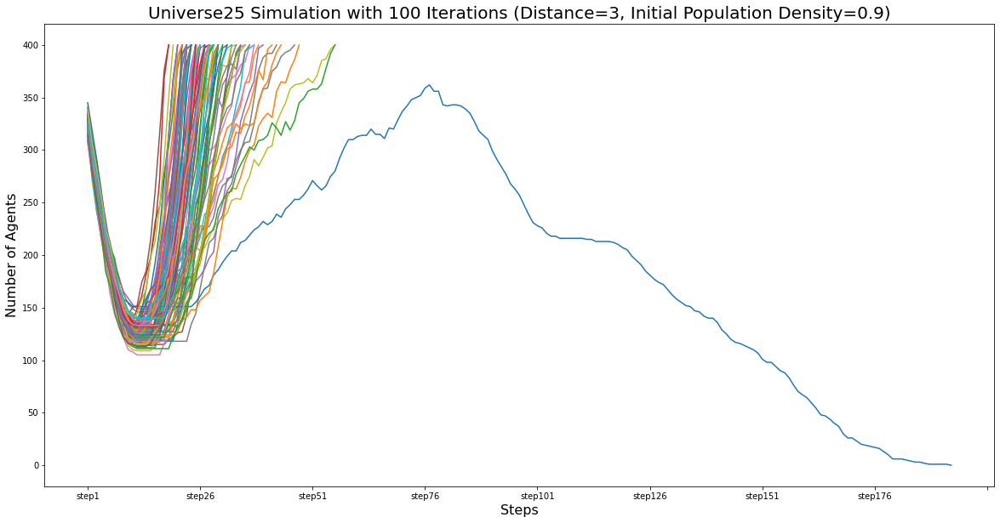

In [25]:
ax = df19.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=3, Initial Population Density=0.9)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

In [26]:
# each step represents 1 week, and the timeframes below are all in weeks 
class Universe25Agent(Agent):
    """
    Universe25 agent
    """

    def __init__(self, uid, pos, model, gender):
        """
        Create a new Universe25 agent.

        Args:
            uid: Unique id for an agent
            pos (x, y): Agent initial location
            gender: Indicator for the agent's gender (female=0, male=1)
        """
        
        super().__init__(uid, model) # allows base class to work with uid + model
        self.uid = uid
        self.pos = pos
        self.gender = gender
        self.life = random.randint(78, 104) # noraml lifespan for mice is 1.5 to 2 years
        self.young = random.randint(8, 12) # mice usually take 2-3 weeks to be mature
        self.social_capacity = random.randint(50, 100) # randomly assign social interaction capacity
        # features for female
        self.preganancy = random.randint(30, 60) # the time needed for getting fertilization
        self.gestation_period = None # gestation period

    def step(self):
        # simulate the social interaction
        for neighbor in self.model.grid.neighbor_iter(self.pos):
            x1, y1 = self.pos
            x2, y2 = neighbor.pos
            # when mice are within a distance of 2 grids from their neighbors
            # they need to be social => social_capacity -= 1
            if math.sqrt((x1-x2)**2 + (y1-y2)**2) <= 4:
                self.social_capacity -= 1
                # if female, decrease the time needed for getting conception, when:
                # it is not a child agent, its social_capacity>0, neighbors are males, and those males' social_capacity>0 as well
                if (~self.young and self.social_capacity>0 and self.gender==0 and neighbor.gender==1 and neighbor.social_capacity>0):
                    self.preganancy -= 1
        
        # if agent is still a cub, have 10% death rate
        if self.young:
            if random.random() < 0.1:
                self.life = 1
            else:
                self.young -= 1
        
        # getting old at each step, and remove it if life ends
        self.life -= 1
        if self.life <= 0:
            self.model.grid._remove_agent(self.pos, self)
            self.model.schedule.remove(self)
            self = None # need this or the cell_content will still content the death agents

        # if agent has fertilized, then it's preganant
        elif self.preganancy <= 0:
            self.gestation_period = random.randint(3, 4) # gestation period is between 3-4 weeks
            self.preganancy = random.randint(30, 60) # reset the fertilization chance
        
        # if alive, reduce gestation_period at each time step
        if self:
            # when social_capacity <= 0, cannot give birth anymore
            if self.social_capacity > 0 and self.gestation_period:
                self.gestation_period -= 1
                
        # agents will move to other empty grids at each step
            self.model.grid.move_to_empty(self)

            
def Unverse25_Dataframe(density, iteration=100):
    '''
    Create dataframe for agent number at each step among all the iteration
    
    Args:
        density: Initial population rate
        iteration: Total number of iteration for the simulation
    '''
    lst = []
    max_len = 0
    for i in range(iteration):
        sub_lst = []
        model = Universe25Model(density=density)
        while model.running:
            model.step()
            sub_lst.append(model.schedule.get_agent_count())
        if max_len < len(sub_lst):
            max_len = len(sub_lst)
        lst.append(sub_lst)

    col = ['step'+str(i) for i in range(1, max_len+1)]
    df = pd.DataFrame(lst, columns=col)
    
    return df

In [27]:
df21 = Unverse25_Dataframe(density=0.1)
df22 = Unverse25_Dataframe(density=0.2)
df23 = Unverse25_Dataframe(density=0.3)
df24 = Unverse25_Dataframe(density=0.4)
df25 = Unverse25_Dataframe(density=0.5)
df26 = Unverse25_Dataframe(density=0.6)
df27 = Unverse25_Dataframe(density=0.7)
df28 = Unverse25_Dataframe(density=0.8)
df29 = Unverse25_Dataframe(density=0.9)

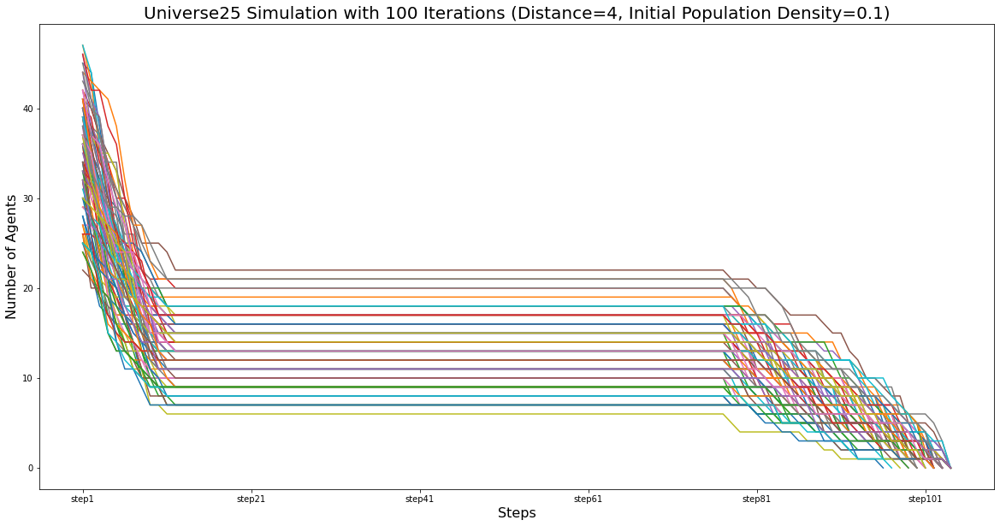

In [28]:
ax = df21.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=4, Initial Population Density=0.1)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

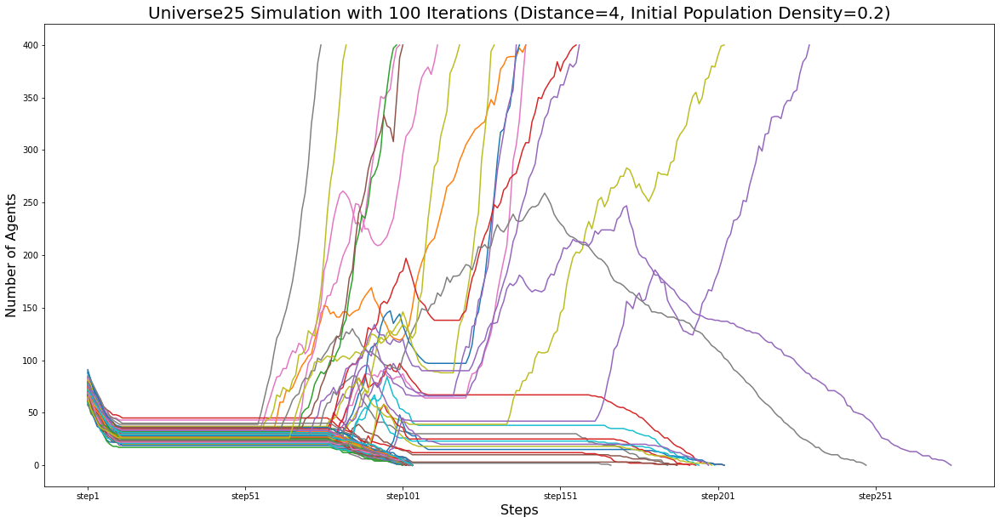

In [29]:
ax = df22.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=4, Initial Population Density=0.2)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

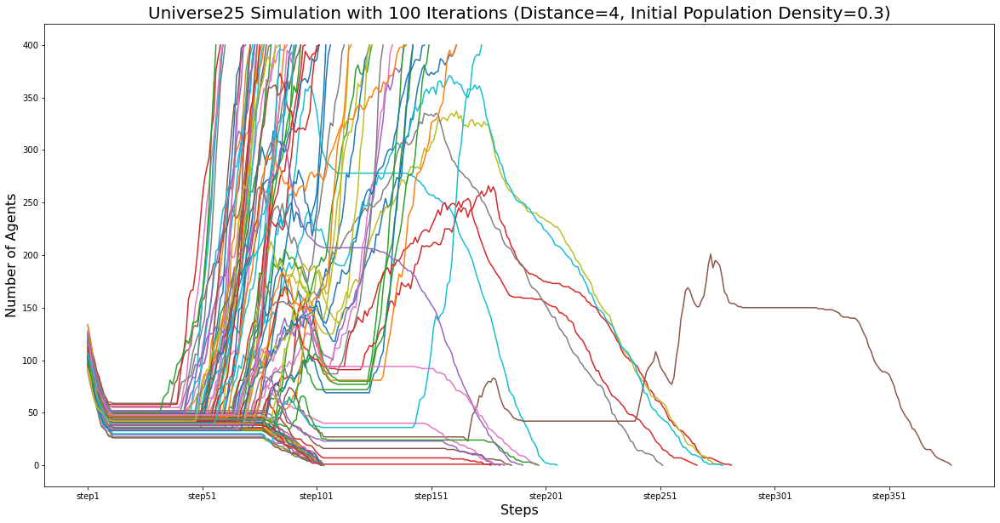

In [30]:
ax = df23.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=4, Initial Population Density=0.3)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

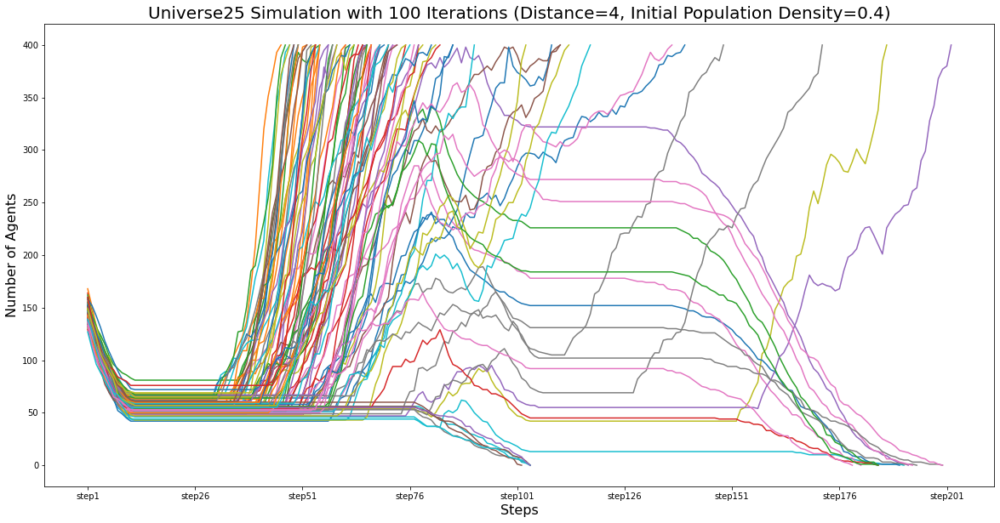

In [31]:
ax = df24.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=4, Initial Population Density=0.4)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

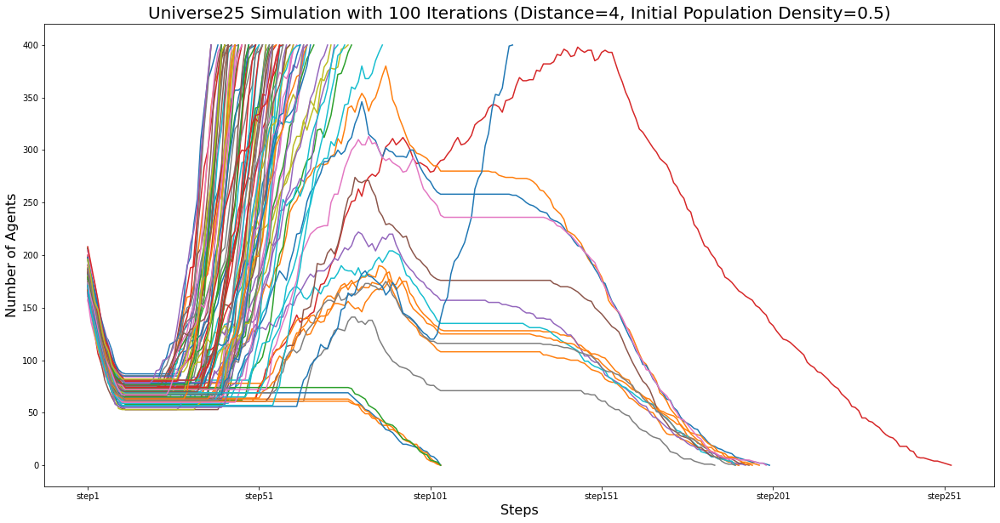

In [32]:
ax = df25.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=4, Initial Population Density=0.5)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

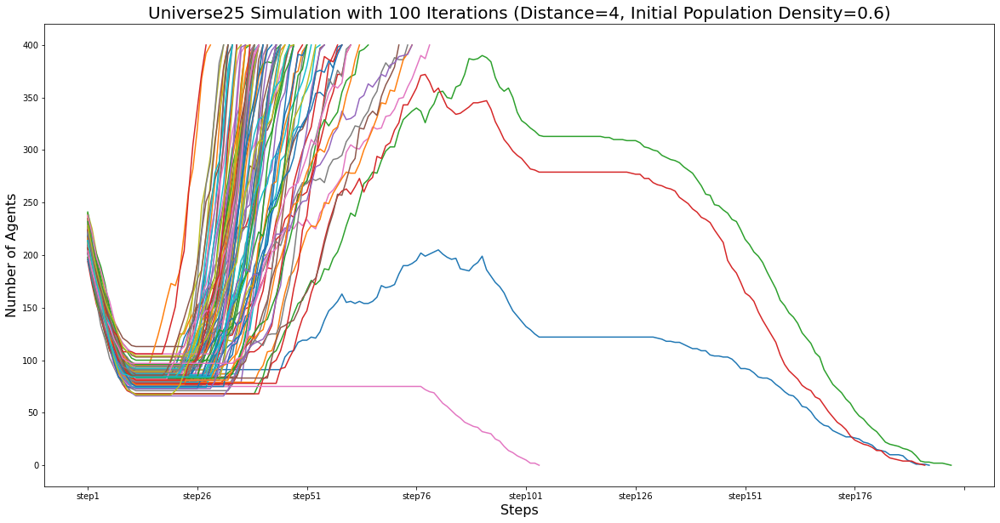

In [33]:
ax = df26.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=4, Initial Population Density=0.6)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

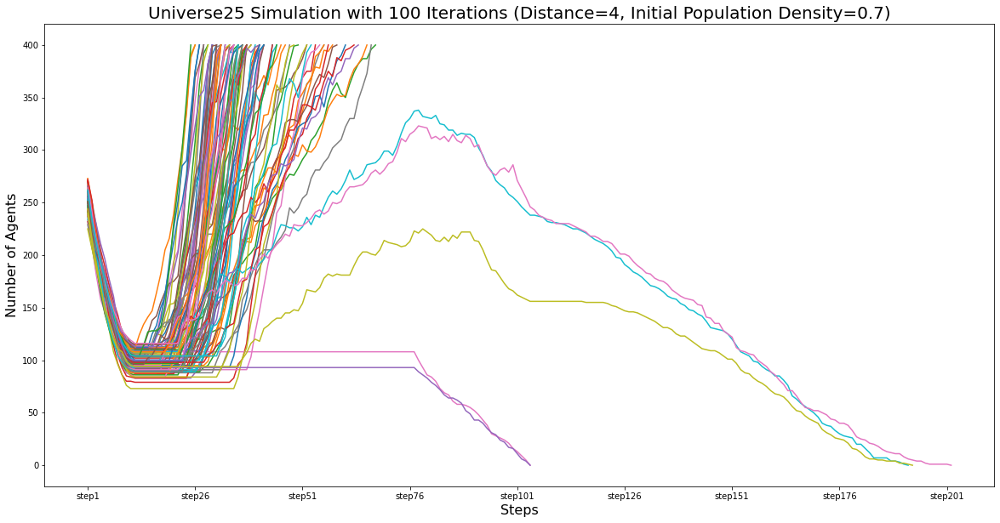

In [34]:
ax = df27.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=4, Initial Population Density=0.7)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

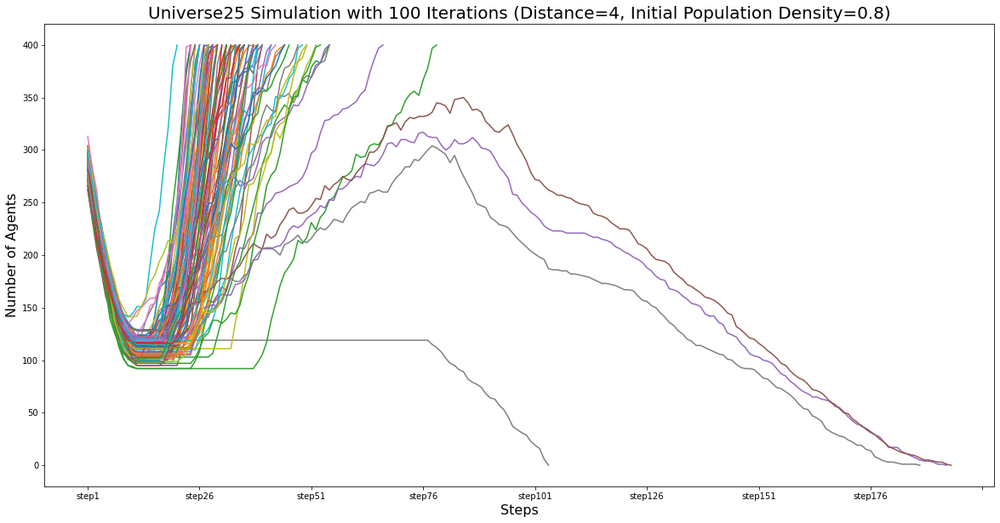

In [35]:
ax = df28.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=4, Initial Population Density=0.8)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);

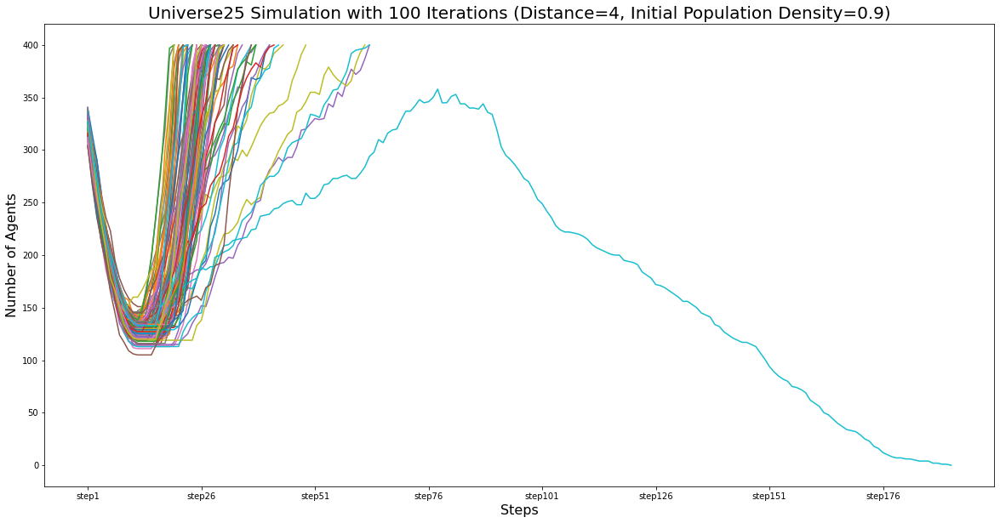

In [36]:
ax = df29.transpose().plot.line(figsize=(20, 10), legend=False)
ax.set_title('Universe25 Simulation with 100 Iterations (Distance=4, Initial Population Density=0.9)', fontsize=20)
ax.set_xlabel("Steps", fontsize=16)
ax.set_ylabel("Number of Agents", fontsize=16);